# Advance Lane Finding Project

In [1]:
#import required lib 

import numpy as np
import matplotlib.pyplot as plt
import cv2
import glob
import pickle
from moviepy.editor import VideoFileClip

### Camera Calibration
Calibrate camera using chessboard images provided under `camera_cal`
##### Steps
1. Read images from folder `camera_cal` using blob for images with pattern `calibration*.jpg`
2. Convert to GRAY scale from RGB since reading through pyplot lib.
3. Find corners of the chess board using function findChessboardCorners
4. If corners found then add the details to imgpoints and objectpoints
5. Visualize the images with corners drawn
6. Calibrate the camera with data collected 

Calibration Image Shape :  (720, 1280, 3)


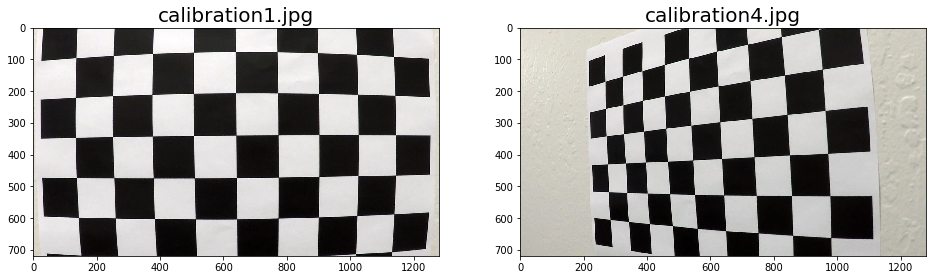

In [2]:
# get the shape of the calibration image

calimage = plt.imread("camera_cal/calibration1.jpg")
print ("Calibration Image Shape : " , calimage.shape)

#visualize one or more of the image
fig,axis= plt.subplots(1, 2, figsize=(16, 16))
axis[0].imshow(calimage)
axis[0].set_title("calibration1.jpg",fontsize=20)
axis[1].imshow( plt.imread("camera_cal/calibration4.jpg"))
axis[1].set_title("calibration4.jpg",fontsize=20)



Calibration Completed and saved to file calibration_details.p , below images were not included for calibration.
['camera_cal\\calibration1.jpg', 'camera_cal\\calibration4.jpg', 'camera_cal\\calibration5.jpg']


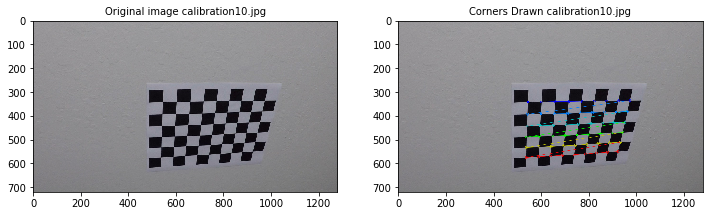

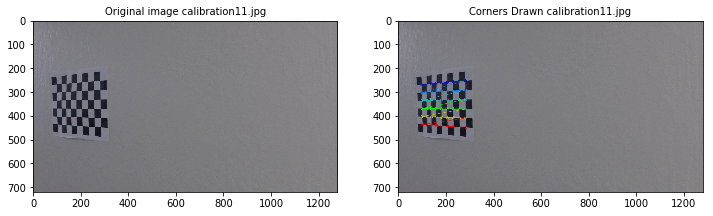

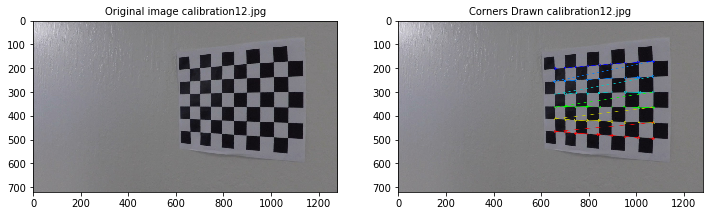

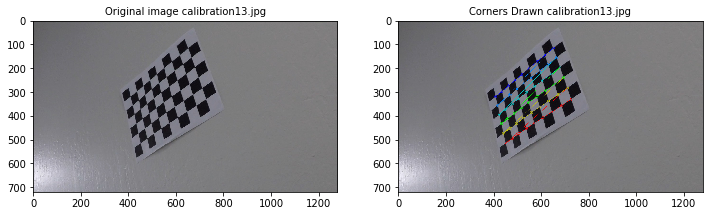

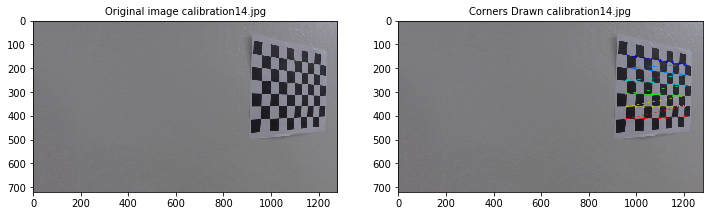

...

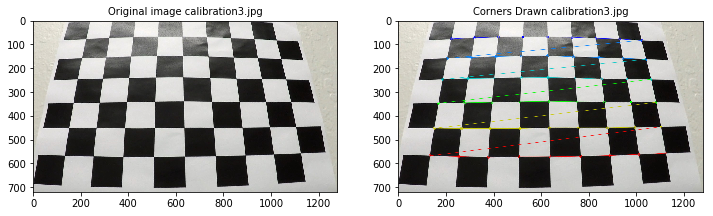

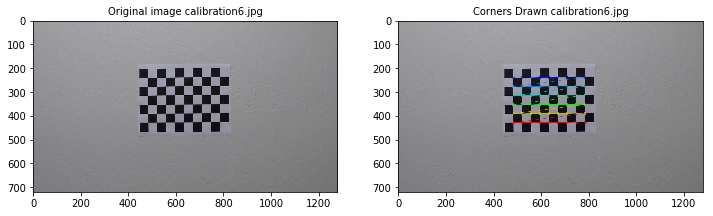

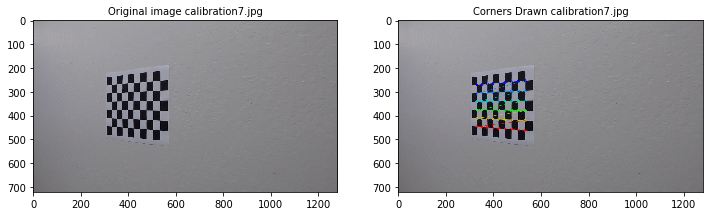

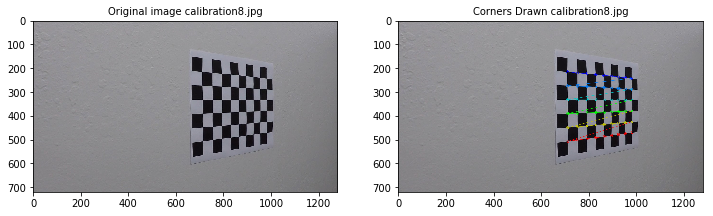

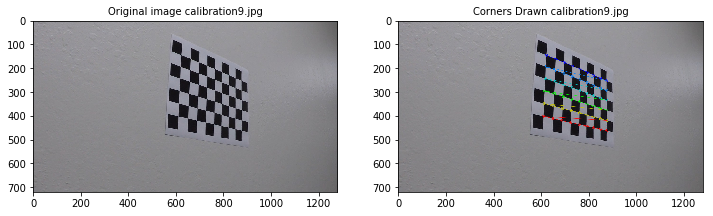

In [3]:
# code to read all the images from folder for calibration
x=9 # No.of Boxes along x
y=6 # No. of Boxes along y
c=3 # No. of Channels
img_size=(calimage.shape[1],calimage.shape[0]) # size of the image

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
obj_ponits = np.zeros((y*x,c), np.float32)
obj_ponits[:,:2] = np.mgrid[0:x, 0:y].T.reshape(-1,2)

# Arrays to store object points and image points from all the images 
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
NoChessBord =[] # to have list of images where boxes are not as per x and y 

# get list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners

for idx, fname in enumerate(images):
    img = plt.imread(fname)
    oimg = np.copy(img)
      
    # convert to GRAY scale from RGB since we are reading through pyplot
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Find the chessboard corners using function findChessboardCorners
    ret, corners = cv2.findChessboardCorners(gray, (x,y), None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(obj_ponits)
        imgpoints.append(corners)

        # Draw and display the corners
        cv2.drawChessboardCorners(img, (x,y), corners, ret)
        
        #visualize the images with corners drawn
        cal_fig , cal_axis = plt.subplots(1, 2, figsize=(12, 12))
        
        cal_axis[0].imshow(oimg)
        cal_axis[0].set_title("Original image " + fname.split('\\')[-1] , fontsize=10)
        cal_axis[1].imshow(img)
        cal_axis[1].set_title("Corners Drawn " + fname.split('\\')[-1] , fontsize=10)
        #save the images to outout folder
        plt.imsave("output_images/Corners_"+ fname.split('\\')[-1],img)
        
    else :
        
        NoChessBord.append(fname)
        
# Do camera calibration using object points and image points
ret, camera_mtx, distortion_coeffs, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

# save the data of calibration to .pickle file
calibrate_pickle = {}
calibrate_pickle["camera_mtx"] = camera_mtx
calibrate_pickle["distortion_coeffs"] = distortion_coeffs
pickle.dump( calibrate_pickle, open( "calibration_details.p", "wb" ) )

print ("Calibration Completed and saved to file calibration_details.p , below images were not included for calibration.")
print (NoChessBord)


### Undistort Pipeline

In [4]:
#function to perform undistort on passed images
def undistortImage(img):
    
    #load the calibration data from pickle file
    calib_details= pickle.load(open("calibration_details.p","rb"))
    camera_mtx=calib_details["camera_mtx"]
    distortion_coeffs= calib_details["distortion_coeffs"]
    #use cv2.undistort function to apply undistortion
    result=cv2.undistort(img, camera_mtx, distortion_coeffs, None, camera_mtx)
    return result

##### Visualize the Undistorted Image on Test Images

Visualize the Undistored Test Images


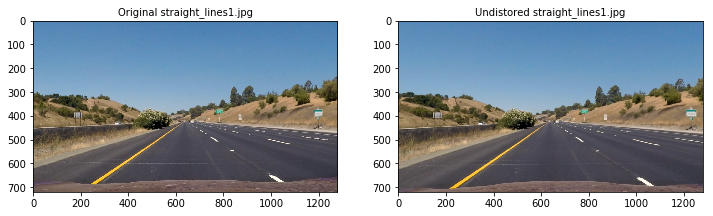

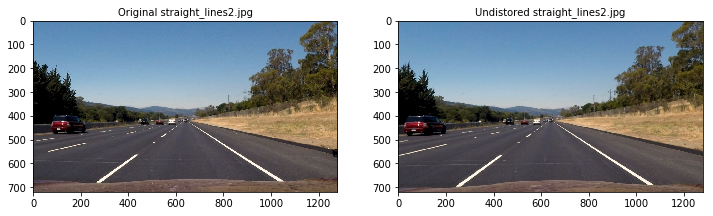

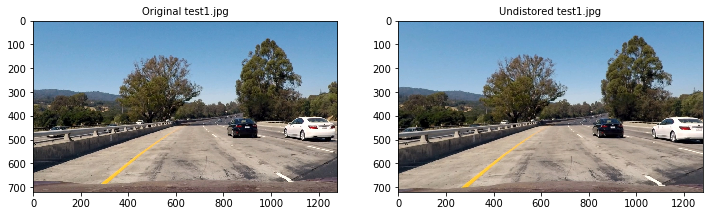

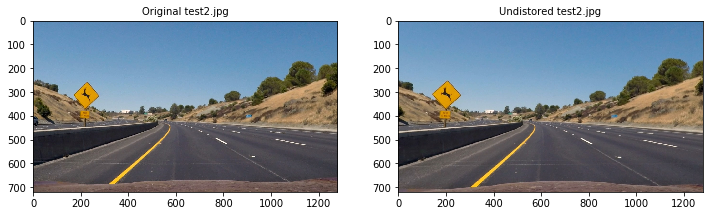

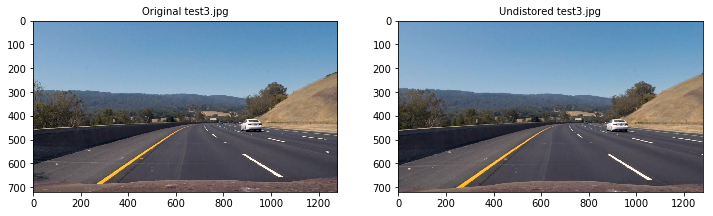

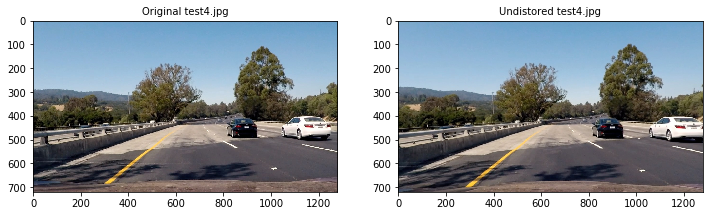

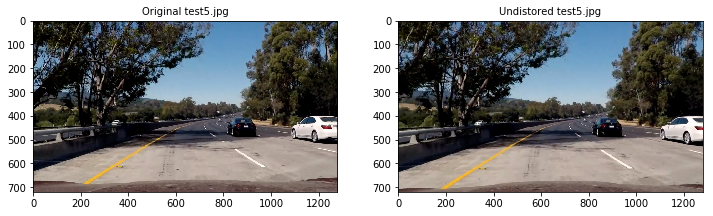

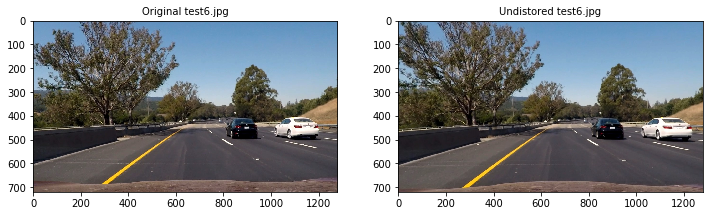

In [5]:
#load test images to be undistorted using GLOB
testImages = glob.glob('test_images/*.jpg')

print ("Visualize the Undistored Test Images")

# traverese from the previous list
for idx, fname in enumerate(testImages):
    img = plt.imread(fname)
    # undistort the images
    dst = undistortImage(img)
    
    #visualize the images 
    udis_fig , udis_axis = plt.subplots(1, 2, figsize=(12, 12))
       
    udis_axis[0].imshow(img)
    udis_axis[0].set_title("Original " + fname.split('\\')[-1] , fontsize=10)
    udis_axis[1].imshow(dst)
    udis_axis[1].set_title("Undistored " + fname.split('\\')[-1] , fontsize=10)
    #save to output_images
    plt.imsave("output_images/Undistort_"+ fname.split('\\')[-1],dst)

### Color Transforms, Gradients Thresholds  to create a thresholded binary image.


#### 1. Gradient Threholds
Used Sobel x , to detect lane lines 

In [6]:
#image passed should be in gray scale
def sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    #sobel for x
    if orient.lower()=='x' :
        sobel= cv2.Sobel(img,cv2.CV_64F,1,0,ksize=sobel_kernel)
    # sobel for y
    elif orient.lower()=='y' :
        sobel= cv2.Sobel(img,cv2.CV_64F,0,1,ksize=sobel_kernel)
    
    #calculate absolute
    abs_sobel= np.absolute(sobel)
    
    #scale to value between 0 and 255
    scale_img= np.uint8(255*(abs_sobel)/np.max(abs_sobel))
    
    #apply the threshold for binary output
    grad_binary=np.zeros_like(scale_img)
    grad_binary[(scale_img > thresh[0] )&(scale_img < thresh[1] )]=1
    
    return grad_binary

Visualize the Sobel X on Test Images


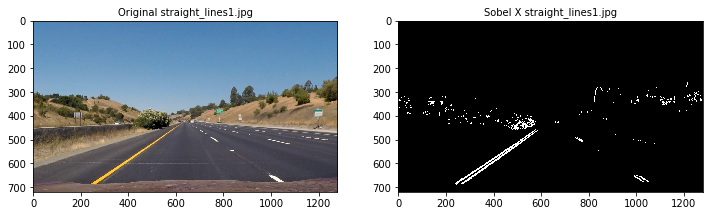

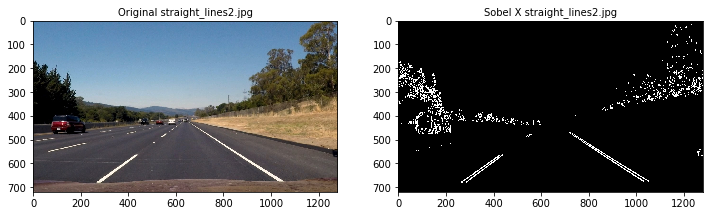

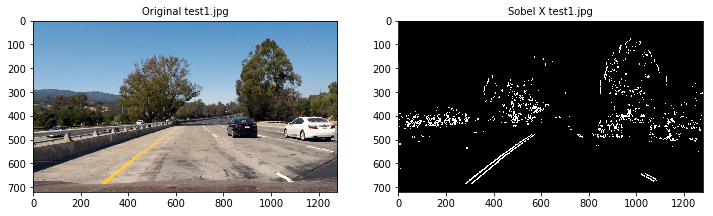

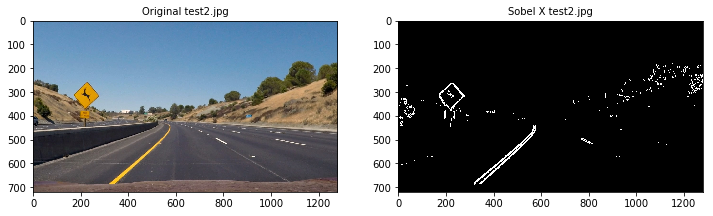

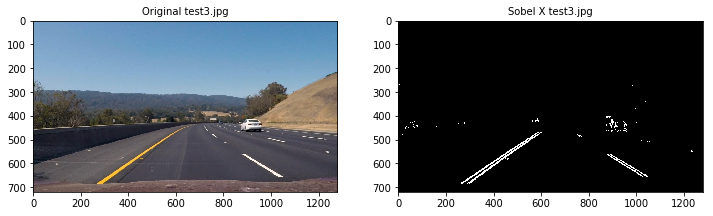

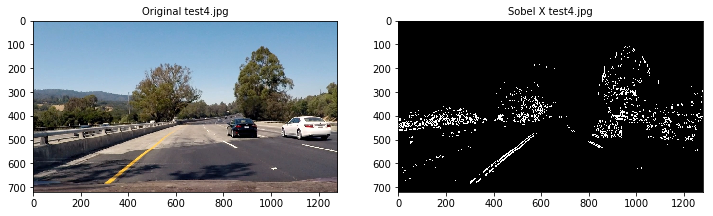

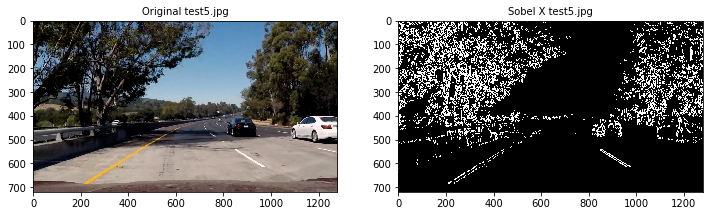

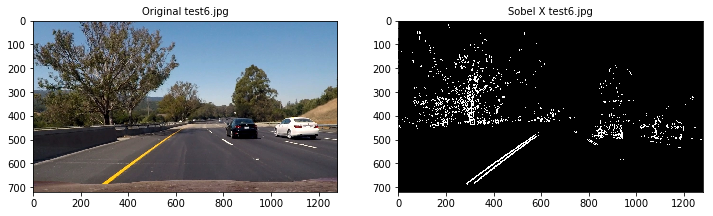

In [7]:
#visualize sobelx 
#load test images using GLOB
testImages = glob.glob('test_images/*.jpg')

print ("Visualize the Sobel X on Test Images")

# traverese from the previous list
for idx, fname in enumerate(testImages):
    img = plt.imread(fname)
    # apply sobel & convert to binary
    simg= cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    
    res = sobel_thresh(simg[:,:,2],orient='x', thresh=(45,190),sobel_kernel=13)
    
    #visualize the images 
    res_fig , res_axis = plt.subplots(1, 2, figsize=(12, 6))
       
    res_axis[0].imshow(img)
    res_axis[0].set_title("Original " + fname.split('\\')[-1] , fontsize=10)
    res_axis[1].imshow(res,cmap='gray')
    res_axis[1].set_title("Sobel X " + fname.split('\\')[-1] , fontsize=10)
    #save to output_images
    plt.imsave("output_images/sobelx_"+ fname.split('\\')[-1],res)
    

#### 1. Color Thresholds
Experimented with various color spaces for lane line detection under various conditions such as extreme brightness , shadow , yellow lane lines , white lane lines. Used R and G channel of RGB color space as white & yellow lines are detected well under this channel .Also used L and S channel from HLS color space to overcome brightness and darkness on the screen. Also Tried HSV color space but lanes lines were not prominant as compared to HSV



In [8]:
#functions related to various color thresholds

def hlsSelect(img, thresh=(0, 255),channel=1):
    # Convert to HLS color space
    hlsimg = cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    # Apply a threshold to the passed channel
    pChannel = hlsimg[:,:,channel]
    # Return a binary image of threshold result
    binary_output = np.zeros_like(pChannel)
    binary_output[(pChannel > thresh[0]) & (pChannel <= thresh[1]) ]=1
    
    return binary_output

def hsvSelect(img, thresh=(0,255),channel=1):
    # Convert to HSV color space
    hsvimg = cv2.cvtColor(img,cv2.COLOR_RGB2HSV)
    # Apply a threshold to the passed channel
    pChannel = hsvimg[:,:,channel]
    # Return a binary image of threshold result
    binary_output = np.zeros_like(pChannel)
    binary_output[(pChannel > thresh[0]) & (pChannel <= thresh[1]) ]=1
    
    return binary_output

def labSelect(img, thresh=(0,255),channel=1):
    # Convert to LAB color space
    labimg = cv2.cvtColor(img,cv2.COLOR_RGB2LAB)
    # Apply a threshold to the passed channel
    pChannel = labimg[:,:,channel]
    # Return a binary image of threshold result
    binary_output = np.zeros_like(pChannel)
    binary_output[(pChannel > thresh[0]) & (pChannel <= thresh[1]) ]=1
    
    return binary_output

def rgbSelect(img, thresh=(0,255),channel=0):
   
    # Extract channel
    pChannel = img[:,:,channel]
    #R eturn a binary image of threshold result
    binary_output = np.zeros_like(pChannel)
    binary_output[(pChannel > thresh[0]) & (pChannel <= thresh[1]) ]=1
    
    return binary_output

Visualize the Color Thresholds on Test Images


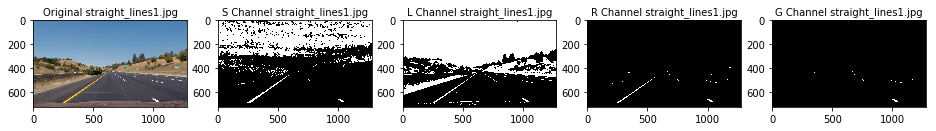

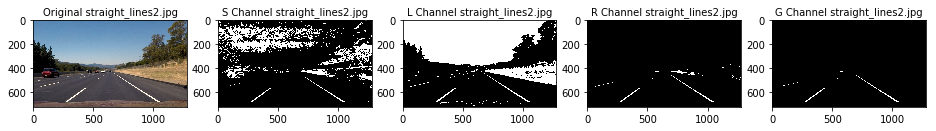

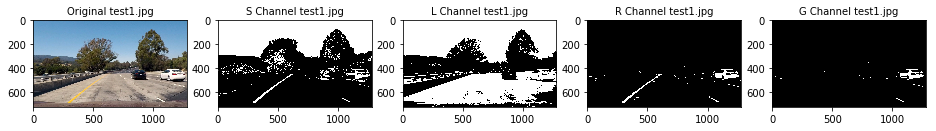

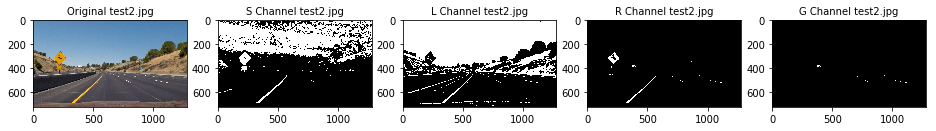

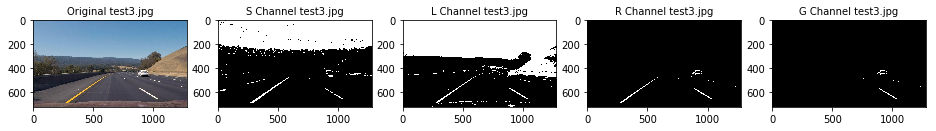

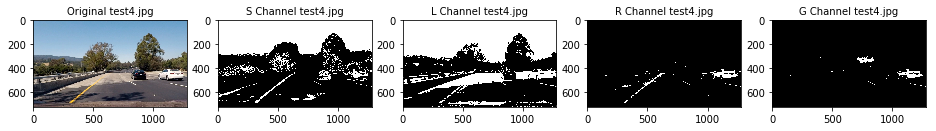

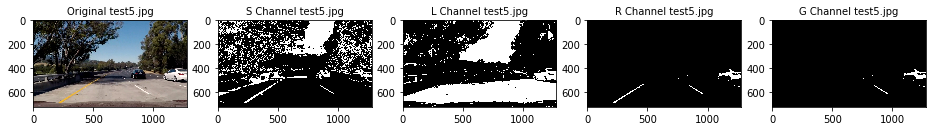

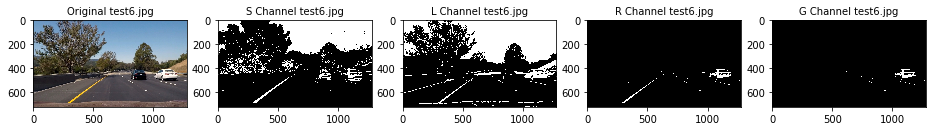

In [10]:
#visualize color thresholds 
#load test images using GLOB
testImages = glob.glob('test_images/*.jpg')

print ("Visualize the Color Thresholds on Test Images")

# traverese from the previous list
for idx, fname in enumerate(testImages):
    img = plt.imread(fname)
    # apply s channel
    res_s = hlsSelect(img,(100,255),2)
    # apply l channel
    res_l = hlsSelect(img,(120,255),1)
    # apply r channel
    res_r = rgbSelect (img, (215,255),0 )
    # apply g channel
    res_g = rgbSelect (img,(215,255),1)

    #visualize the images 
    res_fig , res_axis = plt.subplots(1, 5, figsize=(16, 16))
       
    res_axis[0].imshow(img)
    res_axis[0].set_title("Original " + fname.split('\\')[-1] , fontsize=10)
    res_axis[1].imshow(res_s,cmap='gray')
    res_axis[1].set_title("S Channel " + fname.split('\\')[-1] , fontsize=10)
    res_axis[2].imshow(res_l,cmap='gray')
    res_axis[2].set_title("L Channel " + fname.split('\\')[-1] , fontsize=10)
    res_axis[3].imshow(res_r,cmap='gray')
    res_axis[3].set_title("R Channel " + fname.split('\\')[-1] , fontsize=10)
    res_axis[4].imshow(res_g,cmap='gray')
    res_axis[4].set_title("G Channel " + fname.split('\\')[-1] , fontsize=10)
    #save to output_images
    plt.imsave("output_images/schannel_"+ fname.split('\\')[-1],res_s)
    plt.imsave("output_images/lchannel_"+ fname.split('\\')[-1],res_l)
    plt.imsave("output_images/rchannel_"+ fname.split('\\')[-1],res_r)
    plt.imsave("output_images/gchannel_"+ fname.split('\\')[-1],res_g)
    

#### Combine Color and Gradient Thresholds to create final binary output
Combine both color and gradient threshold using OR (|) , AND (&) operators , also apply ROI mask so that unwanted region is removed and we only have focused image

In [11]:
def combined_thresholds(img,rthresh=(215,255),sthresh=(100,255),xthresh=(45,190),gthresh=(215,255),lthresh=(120,255)):
        
    s_channel = hlsSelect(img,sthresh,2)
    l_channel = hlsSelect(img,lthresh,1)
    r_channel = rgbSelect (img, rthresh,0 )
    g_channel = rgbSelect (img,gthresh,1)

    simg= cv2.cvtColor(img,cv2.COLOR_RGB2HLS)
    sobelx = sobel_thresh(simg[:,:,2], orient='x', thresh=xthresh,sobel_kernel=13)
    
    combined_binary = np.zeros_like(s_channel)
    combined_binary[ (( s_channel==1) & (l_channel==1) ) | ((r_channel==1) | (g_channel==1)) | (sobelx==1) ] = 1

    mask = np.zeros_like(combined_binary)
   
    region_of_interest_vertices = np.array([[210,700], [550,450], [750,450] , [1200,700]], dtype=np.int32)
    
    cv2.fillPoly(mask, [region_of_interest_vertices], 1)
    thresholded = cv2.bitwise_and(combined_binary, mask)
   
    return thresholded

Visualize the Combined Thresholds on Test Images


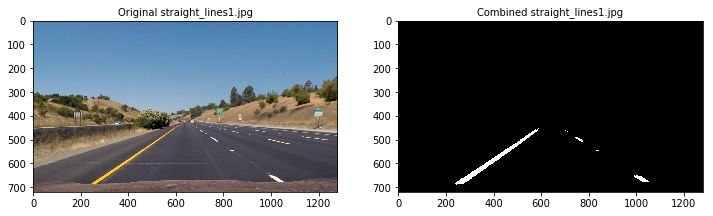

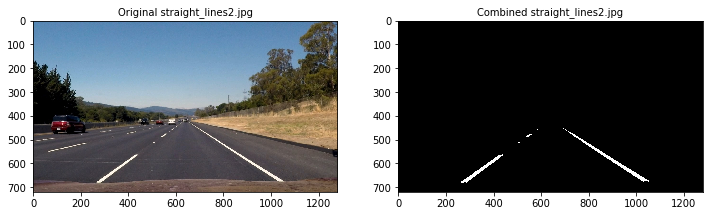

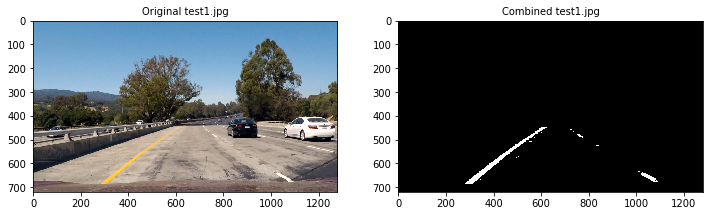

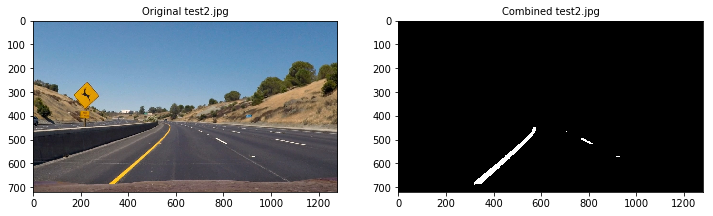

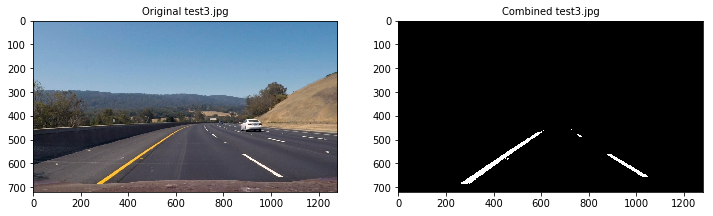

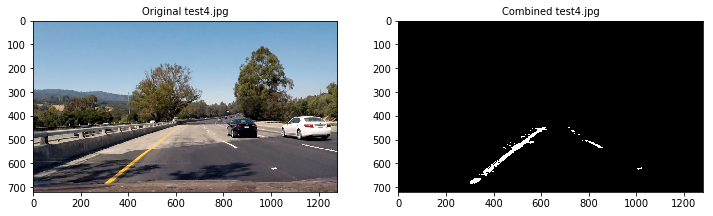

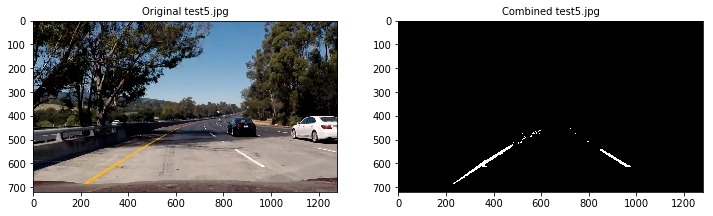

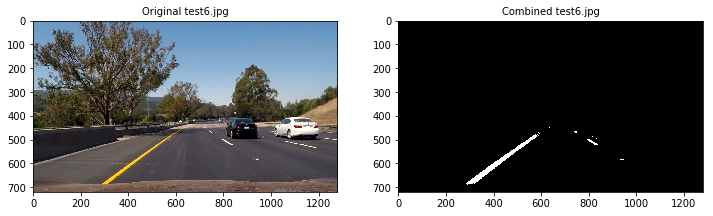

In [12]:
# visualize combined threshold with ROI
#load test images using GLOB
testImages = glob.glob('test_images/*.jpg')

print ("Visualize the Combined Thresholds on Test Images")

# traverese from the previous list
for idx, fname in enumerate(testImages):
    img = plt.imread(fname)
   
    res = combined_thresholds(img)
    
    #visualize the images 
    res_fig , res_axis = plt.subplots(1, 2, figsize=(12, 6))
       
    res_axis[0].imshow(img)
    res_axis[0].set_title("Original " + fname.split('\\')[-1] , fontsize=10)
    res_axis[1].imshow(res,cmap='gray')
    res_axis[1].set_title("Combined " + fname.split('\\')[-1] , fontsize=10)
    #save to output_images
    plt.imsave("output_images/combined_"+ fname.split('\\')[-1],res)

### Perspective Transform
apply perspective transform by selecting appropraite source and destination points. have used cv2.getPerspectiveTransform


In [13]:
def get_perspectiveDetails(img,ret_inverse=False,ret_ROI=False):
   
    src_topleft=[587,454]
    src_topright=[694,454]
    src_bottomleft=[243,685]
    src_bottomright=[1055,685]

    src_points = np.float32([src_topleft,src_topright,src_bottomright,src_bottomleft])
    
    srcplot = np.array( [[src_topleft,src_topright,src_bottomright,src_bottomleft]] , np.int32)
    dst_topleft=[243,0]
    dst_topright=[1055,0]
    dst_bottomleft=[243,685]
    dst_bottomright=[1055,685]
    
    
    dst_points = np.float32([dst_topleft,dst_topright,dst_bottomright,dst_bottomleft])
    dstplot = np.array( [[dst_topleft,dst_topright,dst_bottomright,dst_bottomleft]] , np.int32)
    
    
    M = cv2.getPerspectiveTransform(src_points, dst_points)
    
    Minv = cv2.getPerspectiveTransform(dst_points,src_points)
    
    if ret_inverse == True :
        result = Minv
    else :
        result = M
    
    if ret_ROI == True :
        return result, srcplot ,dstplot
    
    else:
        return result

##### Use values returned to WARPP the image to have a bird eye view of the lane lines  , alos calculate histogram of the image and visualize it

Visualize the Warpp on Test Images


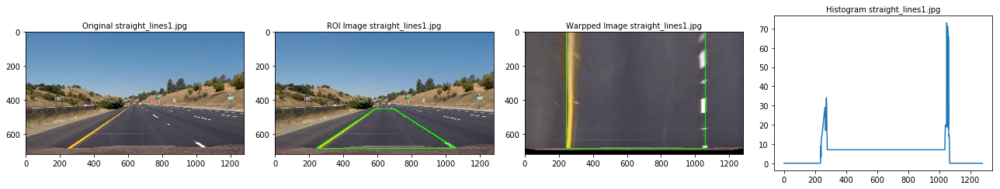

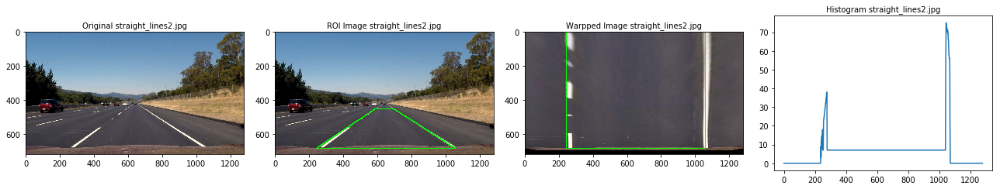

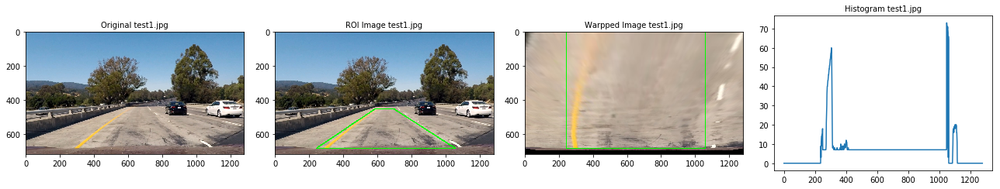

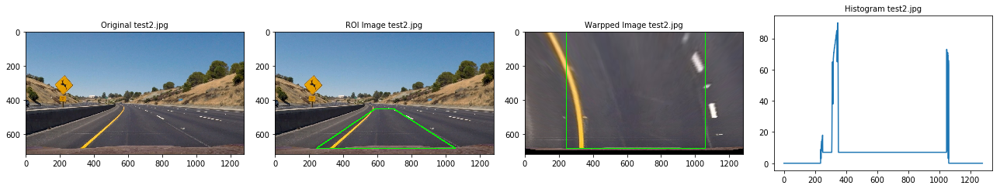

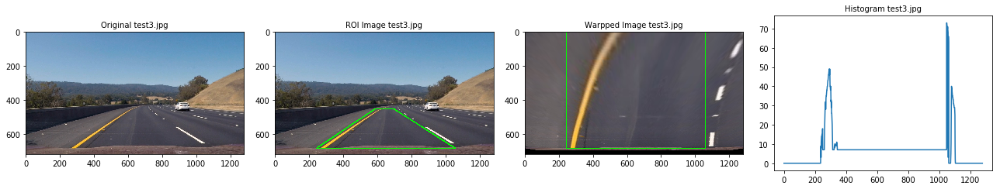

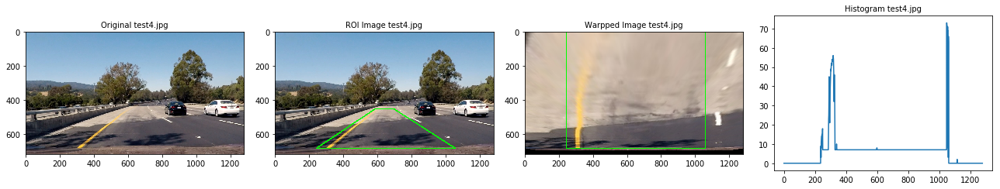

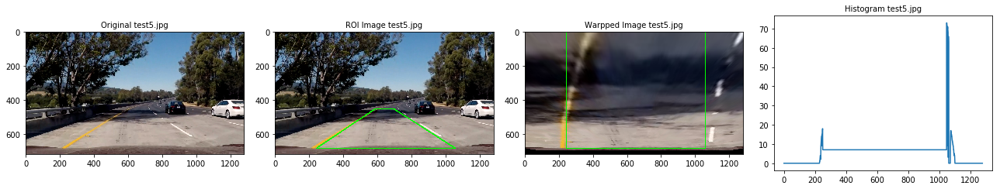

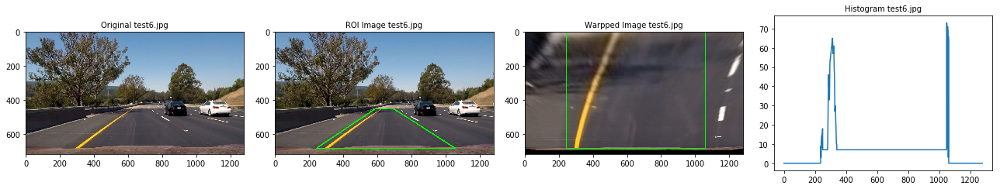

In [15]:
#visualize the warpped image
#load test images using GLOB
testImages = glob.glob('test_images/*.jpg')

print ("Visualize the Warpp on Test Images")

# traverese from the previous list
for idx, fname in enumerate(testImages):
    img = plt.imread(fname)
    img_size= (img.shape[1],img.shape[0])
    
    #get perspective transform
    M,ROI,ROIdst = get_perspectiveDetails(img , ret_ROI=True)
    #create warpped image
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    #for drawing ROI on source image
    cpy_img = np.copy(img)
    poly_img=cv2.polylines(cpy_img,ROI,True,(0,255,0),5)
    
    copywpd = np.copy(warped)
    ply_warped=cv2.polylines(warped,ROIdst,True,(0,255,0),5)
    
    #get histogram of warpped image for peak info
    #convert to single channel 
    cwarp=combined_thresholds(warped)
    histogram = np.sum(cwarp[cwarp.shape[0]//2:,:], axis=0)
    
    #visualize the images
    res_fig , res_axis = plt.subplots(1, 4, figsize=(18, 3.5))
       
    res_axis[0].imshow(img)
    res_axis[0].set_title("Original " + fname.split('\\')[-1] , fontsize=10)
    res_axis[1].imshow(poly_img,cmap='gray')
    res_axis[1].set_title("ROI Image " + fname.split('\\')[-1] , fontsize=10)
    res_axis[2].imshow(ply_warped,cmap='gray')
    res_axis[2].set_title("Warpped Image " + fname.split('\\')[-1] , fontsize=10)
    res_axis[3].plot(histogram)
    res_axis[3].set_title("Histogram " + fname.split('\\')[-1] , fontsize=10)
    plt.tight_layout()
    #save to output_images
    plt.imsave("output_images/warpped_"+ fname.split('\\')[-1],warped)

### identified lane-line pixels and fit their positions with a polynomial
To identify this i used the concept of sliding window from Udacity Course content

In [16]:
def slidingWindowFirst(warpedImg,histogram,visualize=False):
    
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((warpedImg, warpedImg, warpedImg))*255
    # Find the peak of the left and right halves of the histogram which will act as start for left and right lines
    midpoint = np.int(histogram.shape[0]/2) 

    offset=80
    leftx_base = np.argmax(histogram[:midpoint-offset])
    rightx_base = np.argmax(histogram[midpoint+offset:]) + (midpoint)

    # Choose the number of sliding window
    nwindows = 9
    # Set height of windows
    window_height = np.int(warpedImg.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warpedImg.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 200
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = warpedImg.shape[0] - (window+1)*window_height
        win_y_high = warpedImg.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # this is for visualization only
    if visualize==True :
        
        # Generate x and y values for plotting
        ploty = np.linspace(0, warpedImg.shape[0]-1, warpedImg.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        fig, axis = plt.subplots(1,2,figsize=(16,12))
        axis[0].imshow(warpedImg,cmap='gray')
        axis[0].set_title("Warped Window")
        axis[1].imshow(out_img,cmap='gray')
        axis[1].plot(left_fitx, ploty, color='yellow')
        axis[1].plot(right_fitx, ploty, color='red')
        axis[1].set_title("Sliding Window")
        plt.tight_layout()
    else :
         # Generate x and y values for plotting
        ploty = np.linspace(0, warpedImg.shape[0]-1, warpedImg.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        return left_fit,right_fit,ploty,left_fitx,right_fitx

Visualize the Lanes on Test Images


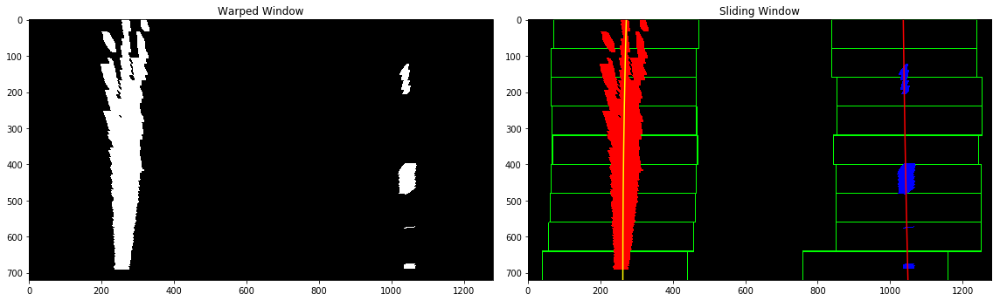

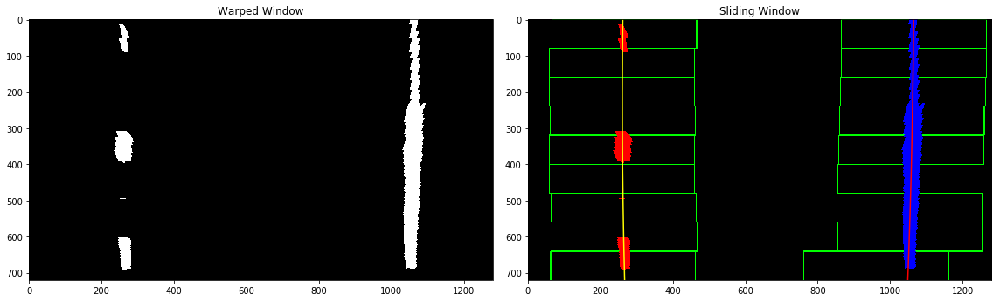

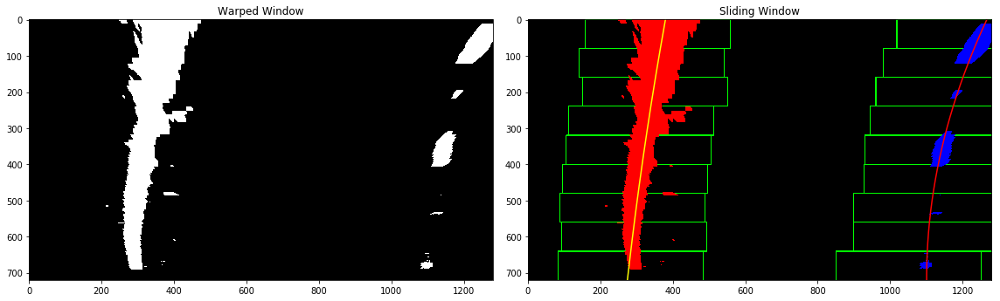

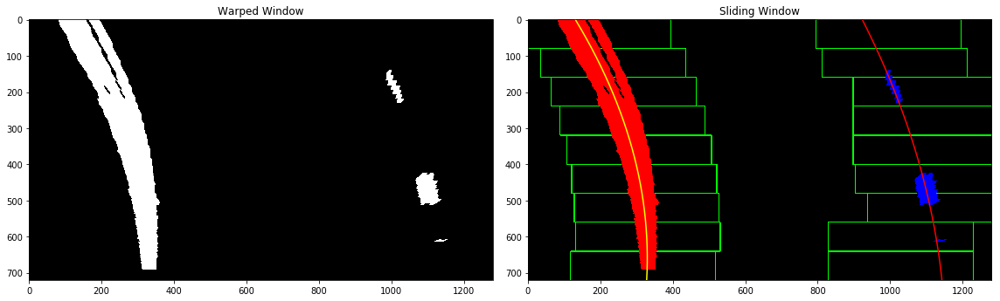

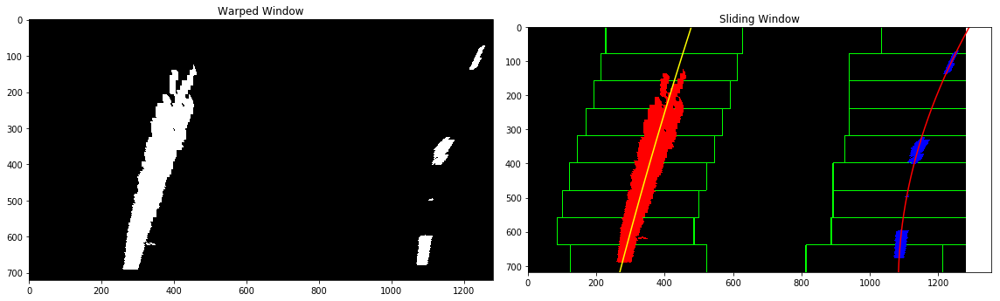

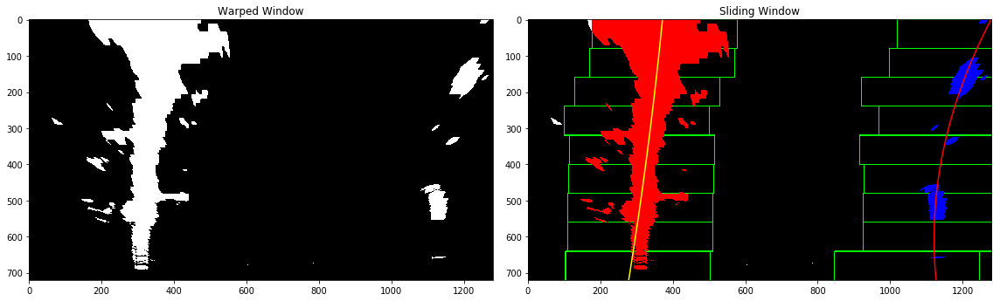

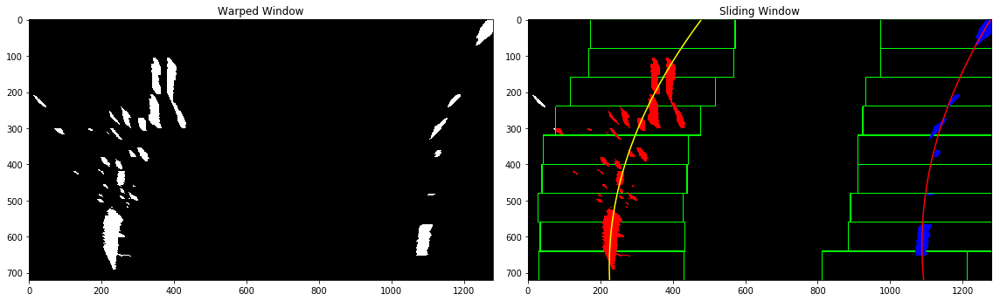

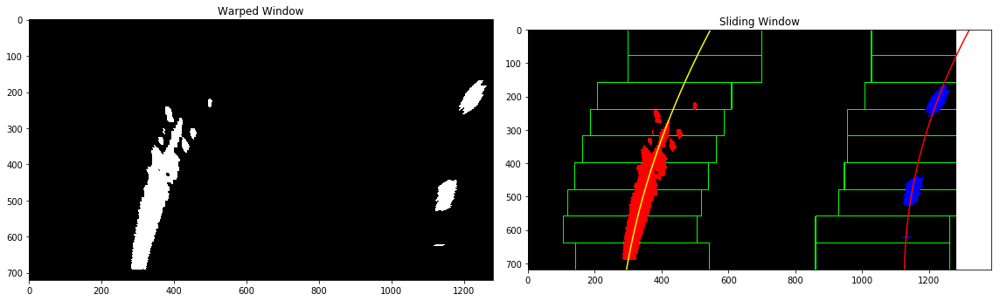

In [17]:
#visulaize the find lanes
#load test images using GLOB
testImages = glob.glob('test_images/*.jpg')

print ("Visualize the Lanes on Test Images")

# traverese from the previous list
for idx, fname in enumerate(testImages):
    img = plt.imread(fname)
    img_size= (img.shape[1],img.shape[0])
    
    dist= undistortImage(img)

    cwarp= combined_thresholds(dist)
    #get perspective transform
    M,ROI,ROI_wp = get_perspectiveDetails(cwarp , ret_ROI=True)
    #create warpped image
    warped = cv2.warpPerspective(cwarp, M, img_size, flags=cv2.INTER_LINEAR)
    
    #get histogram of warpped image for peak info
    histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)
    
    #detect lane lines
    slidingWindowFirst(warped,histogram,visualize=True)
    


### calculate the radius of curvature of the lane and the position of the vehicle with respect to center.
The radius of curvature is computed according to the formula and method described in Udacity classroom. Since we perform the polynomial fit in pixels and whereas the curvature has to be calculated in real world meters, we have to use a pixel to meter transformation and recompute the fit again. Conversion details are taken from classroom.

The mean of the lane pixels closest to the car gives us the center of the lane. The center of the image gives us the position of the car. The difference between them is the offset from the center.

In [18]:
def getCurvatureOffset(ploty,leftx,rightx,warppedimage):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    y_eval = np.max(ploty)
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    #average of left and right Curvature
    avgCurvature= (left_curverad + right_curverad )/2
    
    #calcualte the offset distance from center
    #assuming center as half of the image
    center= warppedimage.shape[1]/2
    #calculated center based on fit lines last value , which is closet to car
    calCenter = (leftx[len(leftx)-1] + rightx[len(rightx)-1])/2
    #subtracting from center to calcualte offset
    offset = abs(center - calCenter)
    #converting it from pixel to meters
    offset = offset * xm_per_pix

    return avgCurvature,offset

In [19]:
def ContinueSliding(warppedimg,left_fit,right_fit):
    nonzero = warppedimg.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
    left_fit[1]*nonzeroy + left_fit[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
    right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, warppedimg.shape[0]-1, warppedimg.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fit , right_fit , ploty , left_fitx , right_fitx


### Plot the lane lines and define pipeline
Use the co-ordinates from slidding window code above and draw the polynomial to fit the lane lines , also append curvature and offset to the image. Combine all code above to define piepline for the video


In [20]:
def pipeline(image):

    global M
    global Minv
    global left_fit , right_fit 
    
    img_size = (image.shape[1],image.shape[0])
    #undistor the image        
    dist = undistortImage(image)
    #find binary image using combined thresholds to detect lines
    combined_img = combined_thresholds(dist)   

    # calcualte only once to reduce processing as M , M-Inverse would be same for same source and destination points
    if M is None :
        M = get_perspectiveDetails(combined_img)
    
    if Minv is None :
        Minv = get_perspectiveDetails(combined_img,ret_inverse=True)
    
    #warp the image for bird eye view
    warped = cv2.warpPerspective(combined_img, M, img_size, flags=cv2.INTER_LINEAR)
    #get histogram for peaks 
    histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)
      
    #find lane lines using sliding window function and continous sliding
    
    if left_fit is None :
        left_fit,right_fit,ploty,left_fitx,right_fitx=slidingWindowFirst(warped,histogram)

    else :
        left_fit,right_fit,ploty,left_fitx,right_fitx=ContinueSliding(warped,left_fit,right_fit)
    #get curvature value and offset value
    curvature,offset = getCurvatureOffset(ploty,left_fitx,right_fitx,warped)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, img_size) 
    # Combine the result with the original image
    result = cv2.addWeighted(dist, 1, newwarp, 0.3, 0)
    
    
    # write text to the final image
    font = cv2.FONT_HERSHEY_TRIPLEX 
    curvature_text = "Radius of Curvature: %.4f m" % curvature
    offset_text= "Offset from Center : %.3f m" % offset
    
    cv2.putText(result,curvature_text , (50, 50), font,1, (150, 255, 255), 2, cv2.LINE_AA)
    cv2.putText(result,offset_text , (50, 100), font, 1, (150, 255, 255), 2, cv2.LINE_AA)

    return result

### Test PipeLine

Visualize the Pipeline on Test Image


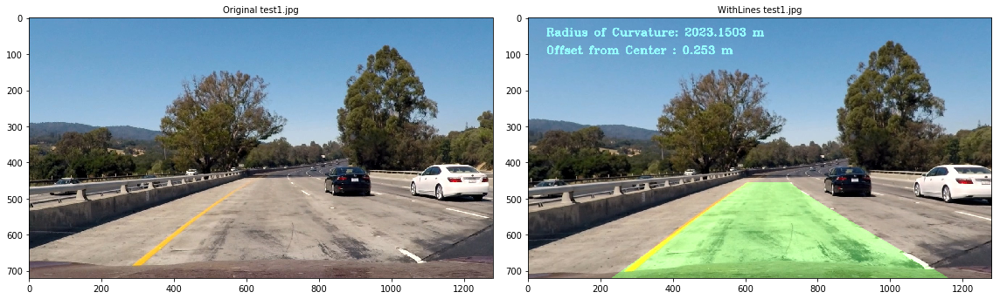

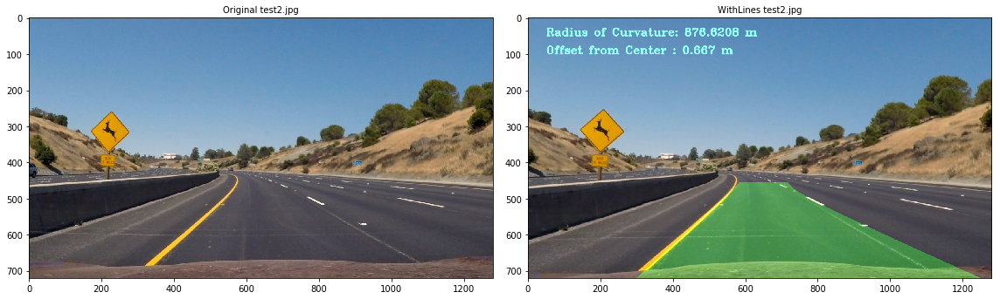

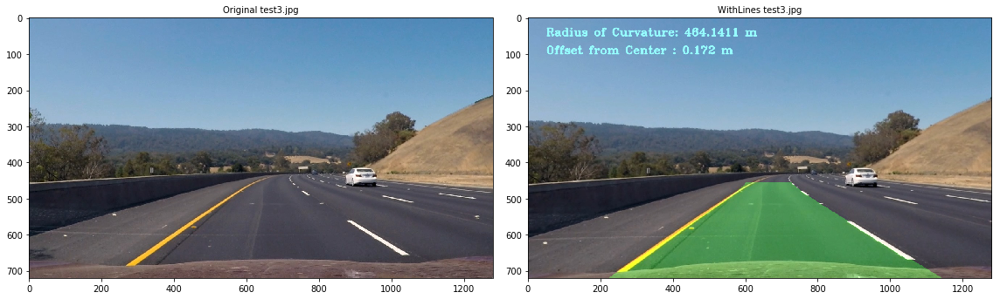

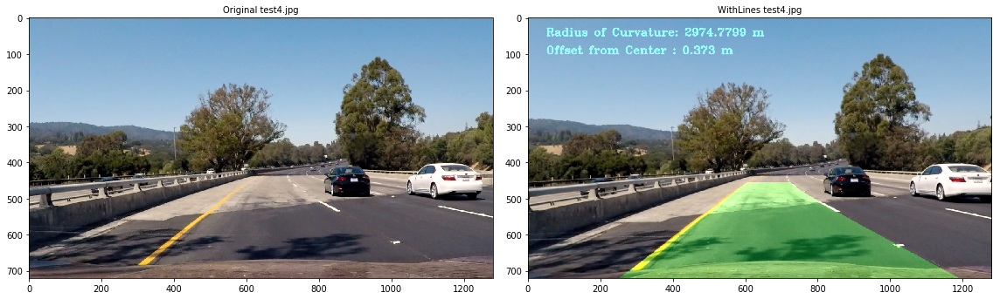

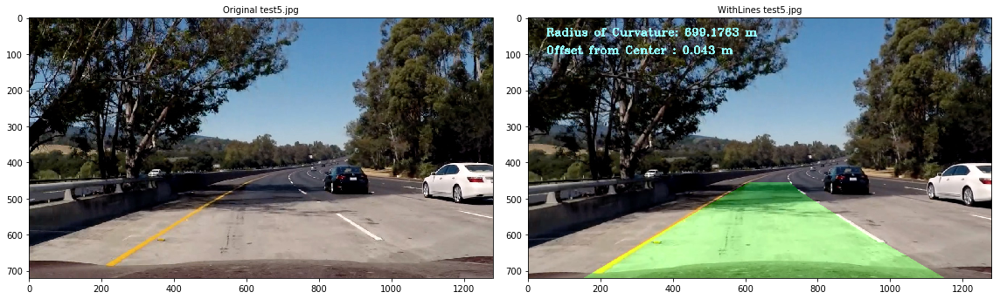

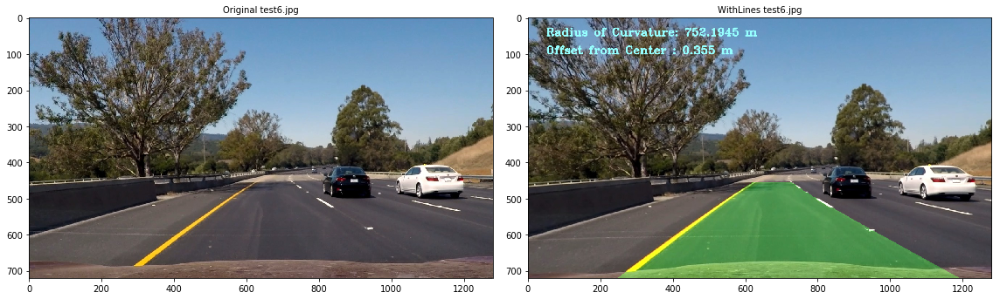

In [23]:
#visualize the pipeline
plt.clf()
M=None
Minv=None
left_fit=None
right_fit=None
loc="test_images/test"
# loc="outputtest_full/"
print ("Visualize the Pipeline on Test Image")

# traverese from the previous list
for i in range(1,7):
    fname=loc + str(i) + ".jpg"
    img = plt.imread(fname)
#     imgo = plt.imread(fname)
#     img = cv2.cvtColor(imgo,cv2.COLOR_RGBA2RGB)
    res = pipeline(img)
    
    #visualize the images with corners drawn
    res_fig , res_axis = plt.subplots(1,2, figsize=(16, 6))
       
    res_axis[0].imshow(img)
    res_axis[0].set_title("Original " + fname.split('/')[-1] , fontsize=10)
    res_axis[1].imshow(res,cmap='gray')
    res_axis[1].set_title("WithLines " + fname.split('/')[-1] , fontsize=10)

    #save to output_images
    plt.imsave("output_images/withlanes_"+ fname.split('/')[-1],res)
    
    plt.tight_layout()

### Video Testing
The code is picked from Project 1 to read the video and apply pipeline to it

In [ ]:
def save_clip(img):
    global i
    plt.imsave("outputtest_full/" + str(i) + ".jpg",img)
    i += 1
    return img



In [24]:
# set global parameters to none before running the tape
M=None
Minv=None
left_fit=None
right_fit=None
output = 'project_video_output.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [04:04<00:00,  6.06it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 4min 6s
